# POC 2B project (Alexnet)

- Creation : *24/05/2025*

**Utilisation de ConvnetWrapperForDeconvolution et vérification de non régression avec cette méthode.**

Réalisation d'un tentative de reproduction de la Figure 2 de l'article :
1. [X] Chargement d'une version de ConvNet (AlexNet ou VGG*) adaptée pour la déconvolution
1. [X] Pour chaque couche cachée choisie dans la Figure 3 de l'article, sur (une sous-partie du)/le jeu de données
   - récupérer le top K des neurones choisis au hasard
   - récupérer le top K des activations maximums par couche, toutes cartes confondues
1. [X] Affichage sous forme de grille des déconvolutions et des champs réceptifs. Comparaison avec les images fournies en entrée.
1. [X] Calcul des déconvolutions des tops K, les champs réceptifs équivalents et les extraits des images en entrée correspondants

## Variables de contrôle

In [ ]:
# Variables de contrôle d'éxécution du script
test_dataloader = True
test_image_one_by_one = False

# Indexes of layer selected in the paper
# 0 : sortie de la première couche opératoire du modèle
#paper_layer_idx = [2, 5, 7, 9, 12]
probed_layer_idx = [7] # couche cachées à surveiller
#probed_neuron_by_layer = [9, 16, 12, 10, 10] # neurones à surveiller dans chaque couche cachée
probed_neuron_by_layer = [12] # neurones à surveiller dans chaque couche cachée
K = 9 # Top K

batch_size = 32
SEED = 42 # Random seed for reproducibility

N_images = 2 # Number of images for image by image test
i_stop = 0 # Stop if i_stop > 0

## Modules

In [2]:
import os
import random
from typing import Tuple

import numpy as np
import torch
import torchvision
from torchvision import transforms as T
from torch.utils.data import DataLoader
from tqdm.notebook import tqdm, trange
from torchinfo import summary
from PIL import Image, ImageDraw

from datasets import imagenet_mean, imagenet_std, DATASET_2, DATASET_1, CustomImageDataset, get_label_data_from_filename
from utils.convnet_wrapper_for_deconvolution import ConvnetWrapperForDeconvolution
from utils.utils_cnn import get_output_sizes, get_receptive_field_in_pixel_space
from utils.utils_images import display_image_tensor as display_image_tensor_, to_0_255, unnormalize, display_images_list_grid, to_0_1, show_image_tensor, to_0_Vmax
from utils.topk import TopK
from utils.deconvolution import deconvolution
from utils.utils_rgb import display_rgb_distributions


In [3]:
model_name = "alexnet"
TORCHVISION_MODELS_WEIGHTS = torchvision.models.AlexNet_Weights

In [4]:
random.seed(SEED)
#rng = np.random.default_rng()

#random_layer_count = rng.integers(len(model_deconv.convnet_features)+1)
#random_layer_idx = rng.choice(len(model_deconv.convnet_features), random_layer_count, replace=False)

In [5]:
# Spécifiquement pour un carnet de type Jupyter
def display_image_tensor(
        img_tensor, resize: Tuple[int, int] = None, resample: int = Image.Resampling.NEAREST, verbose=True
        ):
    if display:
        display_image_tensor_(img_tensor, resize=resize, resample=resample, verbose=verbose, fn_display=display)

## Devices

Détection du GPU disponible.

In [6]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"{device} est disponible")

mps est disponible


## Les données

Création du `dataset`et du `dataloader`.

In [ ]:
#DATASET = DATASET_2 # le 1K images pour l'instant
DATASET = DATASET_1 # le 50K images

imagenet_mean = DATASET["means"]
imagenet_std = DATASET["stds"]

geo_transforms = T.Compose([
    T.Resize(256),
    T.CenterCrop(224),
])
"""
transforms = T.Compose([
    geo_transforms,
    T.Lambda(lambda t: t/255.), # because read_image -> [0..255]
    T.Normalize(mean=imagenet_mean, std=imagenet_std),
])
"""

transforms = TORCHVISION_MODELS_WEIGHTS.IMAGENET1K_V1.transforms()

get_label_data = lambda f: get_label_data_from_filename(f, DATASET["path"])
dataset_path = DATASET["mounted_path"] if os.path.exists(DATASET["mounted_path"]) else DATASET["path"]
print(f"Utilisation du dataset {DATASET['name']} situé dans {dataset_path}")

dataset = CustomImageDataset(
    dataset_path,
    transform=transforms,
    extension="JPEG",
    dataset_mode=True,
    only_label_idx=False, # On a besoin de l'index pour le nom du fichier
    get_label_data=get_label_data,
    )

dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

Utilisation du dataset imagenet_val_images (50K images) situé dans /Users/me/Documents/Work/Dev/_data/imagenet_val_images


En mode test : vérification de la sortie du dataset et du dataloader

In [8]:
if test_dataloader:
    data = dataset[1]
    print(f"data: {data}")

data: (tensor([[[0.8789, 0.9132, 0.9474,  ..., 1.4954, 1.4612, 1.4612],
         [0.8961, 0.8789, 0.9303,  ..., 1.4612, 1.4612, 1.4954],
         [0.8961, 0.8789, 0.8618,  ..., 1.4612, 1.4954, 1.4783],
         ...,
         [1.4269, 1.3927, 1.3070,  ..., 1.8037, 1.7694, 1.7523],
         [1.4440, 1.5297, 1.4612,  ..., 1.8037, 1.8208, 1.7865],
         [1.4783, 1.5125, 1.4954,  ..., 1.7865, 1.7694, 1.7865]],

        [[1.2206, 1.1856, 1.1681,  ..., 1.7458, 1.7808, 1.8333],
         [1.2031, 1.1506, 1.1681,  ..., 1.7808, 1.8158, 1.7983],
         [1.2031, 1.1681, 1.2206,  ..., 1.8158, 1.7983, 1.7808],
         ...,
         [1.6933, 1.6758, 1.6408,  ..., 2.0434, 2.0784, 2.1134],
         [1.6933, 1.8158, 1.7633,  ..., 2.0784, 2.0959, 2.1310],
         [1.6758, 1.7108, 1.7108,  ..., 2.0959, 2.1134, 2.1310]],

        [[1.4897, 1.5071, 1.5420,  ..., 1.8731, 1.8905, 1.9254],
         [1.5071, 1.4897, 1.4897,  ..., 1.8905, 1.8905, 1.8731],
         [1.5071, 1.5071, 1.5420,  ..., 1.9080, 1.8

In [9]:
if test_dataloader:
    # Dans la configuration (dataset_mode=True, only_label_idx=False) => 
    #   [[image_trfm], [label_idx], [label_code], [idx]]
    i_element = 1
    batch = next(iter(dataloader))

    print("Type batch :", type(batch))
    print("Dimension batch:", len(batch), end="\n\n")
    
    print("Première partie du Batch :", batch[0].size())
    print("Deuxième partie du Batch :", batch[1].size())
    print("Troisième partie du Batch :", len(batch[2]))
    print("Quatrième partie du Batch :", batch[3].size(), end="\n\n")
    
    print("Image (taille du tenseur):", batch[0][i_element].size())
    print("Idx etiquette :", batch[1][i_element].item())
    print("Code etiquette :", batch[2][i_element])
    print("Id file :", batch[3][i_element].item())

Type batch : <class 'list'>
Dimension batch: 4

Première partie du Batch : torch.Size([32, 3, 224, 224])
Deuxième partie du Batch : torch.Size([32])
Troisième partie du Batch : 32
Quatrième partie du Batch : torch.Size([32])

Image (taille du tenseur): torch.Size([3, 224, 224])
Idx etiquette : 772
Code etiquette : n04127249
Id file : 46607


## Le modèle

In [ ]:
model_convnet = torch.hub.load('pytorch/vision', model_name, weights=TORCHVISION_MODELS_WEIGHTS.IMAGENET1K_V1)
model_convnet.eval()
model_for_deconv = ConvnetWrapperForDeconvolution(model_convnet, model_convnet.features)

Using cache found in /Users/me/.cache/torch/hub/pytorch_vision_main


Résumé de la structure du modèle de type ConvNet

In [11]:
#print("> Résumé de la structure du modèle de type ConvNet")
print(model_convnet)

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

Tableau des dimensionnalités des couches cachées du modèle

In [ ]:
# print("> Tableau des dimensionnalités des couches cachées du modèle")
batch_input = dataset[0][0].unsqueeze(dim=0)
print(batch_input.size())
model_for_deconv.set_return_switch_indices(False)
summary(model_convnet, input_size=batch_input.size(), mode="eval")

torch.Size([1, 3, 224, 224])


Layer (type:depth-idx)                   Output Shape              Param #
AlexNet                                  [1, 1000]                 --
├─Sequential: 1-1                        [1, 256, 6, 6]            --
│    └─Conv2d: 2-1                       [1, 64, 55, 55]           23,296
│    └─ReLU: 2-2                         [1, 64, 55, 55]           --
│    └─MaxPool2d: 2-3                    [1, 64, 27, 27]           --
│    └─Conv2d: 2-4                       [1, 192, 27, 27]          307,392
│    └─ReLU: 2-5                         [1, 192, 27, 27]          --
│    └─MaxPool2d: 2-6                    [1, 192, 13, 13]          --
│    └─Conv2d: 2-7                       [1, 384, 13, 13]          663,936
│    └─ReLU: 2-8                         [1, 384, 13, 13]          --
│    └─Conv2d: 2-9                       [1, 256, 13, 13]          884,992
│    └─ReLU: 2-10                        [1, 256, 13, 13]          --
│    └─Conv2d: 2-11                      [1, 256, 13, 13]         

## Récupération des activations des neurones surveillés

Création des structures topK et choix aléatoire des coordonnées de $N$ neurones surveillés par couche cachée indiquée.

In [ ]:
# Récupération des tailles des sorties afin de pouvoir choisir des coordonnées aléatoires
# dans les sorties des couches
input_size=batch_input.size()
model_for_deconv.set_return_switch_indices(False)
output_sizes = get_output_sizes(model_for_deconv.convnet_features, input_size=input_size, last_2d=False)
print("Dimensions des différentes couches cachées")
for layer_idx, output_size in enumerate(output_sizes):
    print(f"\tcouche {layer_idx:2d} : {output_size}")

topk_activations_by_neuron = {}
coord_activations = {}
for layer_idx, n_neurons in zip(probed_layer_idx, probed_neuron_by_layer):
    coord_activations[layer_idx] = []
    i = 0
    # Randomly select N coordinates in the output of the layer : chanel, row, col
    while i < n_neurons:
        # Choisir une coordonnée aléatoire dans la sortie de la couche
        #chn = rng.integers(output_sizes[layer_idx][0])
        #row = rng.integers(output_sizes[layer_idx][1])
        #col = rng.integers(output_sizes[layer_idx][2])
        chn = random.randint(0, output_sizes[layer_idx][0]-1)
        row = random.randint(0, output_sizes[layer_idx][1]-1)
        col = random.randint(0, output_sizes[layer_idx][2]-1)
        # Vérifier que la coordonnée n'est pas déjà choisie (on ne veut pas de doublons)
        if (chn, row, col) not in coord_activations[layer_idx]:
            coord_activations[layer_idx].append((chn, row, col))
            i += 1
    topk_activations_by_neuron[layer_idx] = {coord: TopK(K) for coord in coord_activations[layer_idx]}
print(f"Coordonnées choisies : {coord_activations}")

Dimensions des différentes couches cachées
	couche  0 : (64, 55, 55)
	couche  1 : (64, 55, 55)
	couche  2 : (64, 27, 27)
	couche  3 : (192, 27, 27)
	couche  4 : (192, 27, 27)
	couche  5 : (192, 13, 13)
	couche  6 : (384, 13, 13)
	couche  7 : (384, 13, 13)
	couche  8 : (256, 13, 13)
	couche  9 : (256, 13, 13)
	couche 10 : (256, 13, 13)
	couche 11 : (256, 13, 13)
	couche 12 : (256, 6, 6)
Coordonnées choisies : {7: [(327, 1, 0), (379, 4, 3), (114, 2, 11), (52, 10, 11), (279, 1, 9), (216, 0, 0), (47, 3, 3), (258, 9, 0), (287, 3, 11), (332, 11, 8), (214, 3, 7), (301, 4, 12)]}


Générations des activations

In [ ]:
### TEST "image par image###
if test_image_one_by_one:
    dataset_test = CustomImageDataset(
        dataset_path,
        transform=transforms,
        extension="JPEG",
        dataset_mode=False,
        only_label_idx=False, # On a besoin de l'index pour le nom du fichier
        get_label_data=get_label_data,
        )

    model_for_deconv.to(device)
    all_activations = []
    for i in trange(0, N_images):
        image, image_trfm, label_idx, label_code, input_file_idx = dataset_test[i]
        batch_input = image_trfm.unsqueeze(dim=0).to(device)
        activations = model_for_deconv.get_activations(batch_input, coord_activations, verbose=True)
        all_activations.append((activations, torch.tensor([input_file_idx])))

    print(f"Toutes les activations : {all_activations}")

In [ ]:
if not test_image_one_by_one:
    BATCH_IMAGES_TRFM = 0
    #BATCH_LABEL_INDICES = 1
    BATCH_FILE_INDICES = 3

    if i_stop < 0:
        i_stop = min(len(dataloader) + i_stop, 1)
    total = min(i_stop, len(dataloader)) if i_stop else len(dataloader)

    model_for_deconv.to(device)
    all_activations = []
    i_batch = 0
    for batch in tqdm(dataloader, total=total, desc="Propagation", unit="batch"):
        if i_stop and i_batch >= i_stop:
            break
        batch_input = batch[BATCH_IMAGES_TRFM].to(device)
        #batch_label_idx = batch[BATCH_LABEL_INDICES]
        batch_input_file_idx = batch[BATCH_FILE_INDICES]

        # On fait passer le batch dans le modèle
        # et on récupère les activations des couches sélectionnées
        #with torch.no_grad():
        #    model_deconv.convnet_features_to_device(device)

        activations = model_for_deconv.get_activations(batch_input, coord_activations, verbose=False)
        all_activations.append((activations, batch_input_file_idx))

        i_batch += 1

Propagation:   0%|          | 0/1563 [00:00<?, ?batch/s]

Injection dans les topK

In [16]:
for activations, batch_input_file_idx in all_activations:
    for idx_layer, activations_layer in activations.items():
            # On fait le tri pour chaque coordonnée
            for coord, batch_activations_coord in zip(coord_activations[idx_layer], activations_layer):
                topk_activations_by_neuron[idx_layer][coord].append(batch_activations_coord.tolist(), batch_input_file_idx.tolist())

In [17]:
all_max_topk = {}
for idx_layer, coords in topk_activations_by_neuron.items():
    max_topk = 0
    max_topk_file_idx = None
    max_coord = None
    for coord, topk in coords.items():
        print(f"> Layer {idx_layer} neuron {coord} :", topk)
        if topk[0][0] > max_topk:
            max_topk = topk[0][0]
            max_topk_file_idx = topk[0][1]
            max_coord = coord
    all_max_topk[idx_layer] = (max_topk, max_topk_file_idx, max_coord)

> Layer 7 neuron (327, 1, 0) : [(29.321617126464844, 17349), (27.81341552734375, 15944), (24.335033416748047, 46705), (23.21392250061035, 2381), (22.644380569458008, 12908), (22.436588287353516, 7698), (22.100126266479492, 22143), (21.731922149658203, 6356), (20.8695011138916, 43570)]
> Layer 7 neuron (379, 4, 3) : [(51.76260757446289, 11362), (36.440425872802734, 14139), (33.358638763427734, 31869), (32.75972366333008, 10265), (30.839014053344727, 44960), (30.156614303588867, 31570), (29.224018096923828, 24283), (29.18781089782715, 11570), (28.980710983276367, 17504)]
> Layer 7 neuron (114, 2, 11) : [(42.70645523071289, 13488), (42.302146911621094, 38798), (40.55919647216797, 22138), (37.315120697021484, 46385), (37.24177932739258, 13037), (37.067962646484375, 37604), (37.067962646484375, 20056), (36.392303466796875, 41246), (34.22685241699219, 44133)]
> Layer 7 neuron (52, 10, 11) : [(62.939903259277344, 36905), (49.871768951416016, 3015), (43.1909294128418, 562), (42.96964645385742,

In [18]:
for idx_layer, max_topk in all_max_topk.items():
    max_topk, max_topk_file_idx, max_coord = max_topk
    print(f"Layer {idx_layer} neuron {max_coord} : {max_topk} File index : {max_topk_file_idx}")

Layer 7 neuron (52, 10, 11) : 62.939903259277344 File index : 36905


## Déconvolution

### Utils

In [19]:
pil_to_tensor = T.PILToTensor()

In [20]:
def merge_input_and_deconv(background_image, output_deconv, receptive_field, alpha=0.75):
    assert alpha >= 0 and alpha <= 1, "Alpha must be between 0 and 1"

    ((top, left), (bottom, right)) = receptive_field
    background_image = T.functional.to_pil_image(background_image)
    output_deconv = T.functional.to_pil_image(output_deconv).crop((left, top, right, bottom))

    # Ajouter couche alpha pour superposer l'image de sortie sur l'image de fond
    background_image = background_image.convert("RGBA")
    output_resized = output_deconv.convert("RGBA")
    
    # Créer un masque pour la transparence (optionnel)
    mask = Image.new("L", output_resized.size, int(255 * alpha))

    # Coller l'image de sortie sur l'image de fond
    background_image.paste(output_resized, (left, top), mask)

    # Afficher l'image résultante
    #display(background_image)
    return background_image

In [21]:
inv_normalize = T.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255],
    std=[1/0.229, 1/0.224, 1/0.255]
)

### Pour une image

Image originale avant redimensionnement

Dimensions : torch.Size([3, 500, 343]) 	Valeur min : 0 	Valeur max : 255


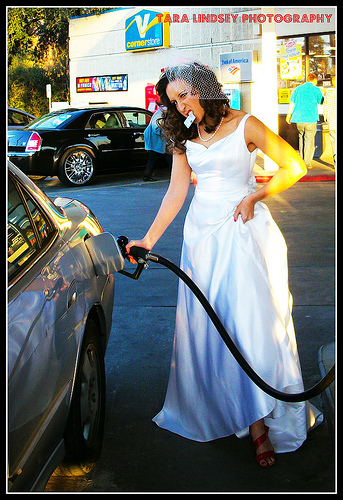

In [22]:
idx_layer, coords = list(topk_activations_by_neuron.items())[0]
coord, topk = list(coords.items())[0]
idx_map, row, col = coord
max_activation, file_idx = topk[0]


image, image_trfm = dataset.get_image(file_idx)
display_image_tensor(image, verbose=True)
probed_neuron = (idx_layer, idx_map, row, col)
idx_layer, idx_map, row, col = probed_neuron

Affichage du champ réceptif du neurone surveillé sélectionné, en prenant en référence l'image après transformation.

In [ ]:
batch_input = image_trfm.unsqueeze(dim=0)
output_sizes = get_output_sizes(model_for_deconv.convnet_features, input_size=batch_input.size())
pixel_space_size = batch_input.size(-2), batch_input.size(-1)
receptive_field = get_receptive_field_in_pixel_space(
    pos=(row, col),
    idx_layer=idx_layer,
    cnn_modules=model_for_deconv.convnet_features,
    output_sizes=output_sizes,
    pixel_space_size=pixel_space_size
)

((top, left), (bottom, right)) = receptive_field
print("Champ réceptif :", receptive_field, "taille :", right-left+1, "x", bottom-top+1)

Champ réceptif : ((0, 0), (80, 64)) taille : 65 x 81


Ne pas oublier de redimensioner l'image (avec `image = geo_transforms(image)`) à l'origine de celle de l'entrée pour rendre cohérente la position du champ réception.

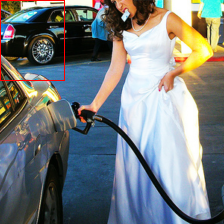

In [24]:
image_resized = geo_transforms(image)
batch_input = batch_input.squeeze(dim=0)
image_resized_receptive_field = T.functional.to_pil_image(image_resized)
img_draw = ImageDraw.Draw(image_resized_receptive_field)
img_draw.rectangle([(left, top), (right, bottom)], outline="red")
display(image_resized_receptive_field)

Déconvolution de l'activation du neurone surveillé sélectionné

In [ ]:
output_deconv = deconvolution(
    model_for_deconv,
    batch_input, # .to(device),
    idx_layer=idx_layer,
    idx_map=idx_map,
    pos=(row, col),
    flip_kernels=False,
    use_bias=False,
    clean_feature_map=True,
    return_pos=False,
    verbose=True
    ).detach().cpu()

[0] forward  Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
	 ouput size: torch.Size([64, 55, 55])
[1] forward  ReLU(inplace=True)
	 ouput size: torch.Size([64, 55, 55])
[2] forward  MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
	 ouput size: torch.Size([64, 27, 27])
[3] forward  Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
	 ouput size: torch.Size([192, 27, 27])
[4] forward  ReLU(inplace=True)
	 ouput size: torch.Size([192, 27, 27])
[5] forward  MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
	 ouput size: torch.Size([192, 13, 13])
[6] forward  Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
	 ouput size: torch.Size([384, 13, 13])
[7] forward  ReLU(inplace=True)
	 ouput size: torch.Size([384, 13, 13])
forwarded output size torch.Size([384, 13, 13]) | switch indices : 2 | min : 0.0 •| max : 83.96894073486328
[7] reverse of  ReLU(inplace=True)
		> output.size :torch.Size

Dimensions : torch.Size([3, 224, 224]) 	Valeur min : -9.7576904296875 	Valeur max : 8.787772178649902


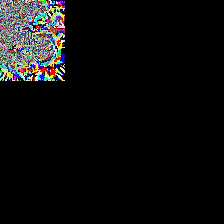

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.75769..8.787772].


Dimensions : torch.Size([3, 224, 224]) 	Valeur min : -9.7576904296875 	Valeur max : 8.787772178649902


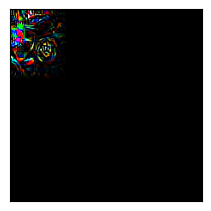

In [26]:
display_image_tensor(output_deconv)
show_image_tensor(output_deconv, figsize=(2, 2))

Dimensions : torch.Size([3, 224, 224]) 	Valeur min : 0.0 	Valeur max : 1.0


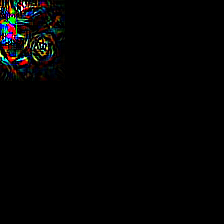

Dimensions : torch.Size([3, 224, 224]) 	Valeur min : 0.0 	Valeur max : 1.0


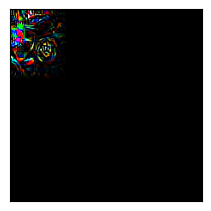

In [27]:
display_image_tensor(output_deconv.clamp(0, 1))
show_image_tensor(output_deconv.clamp(0, 1), figsize=(2, 2))

Dimensions : torch.Size([3, 80, 64]) 	Valeur min : -9.7576904296875 	Valeur max : 8.787772178649902


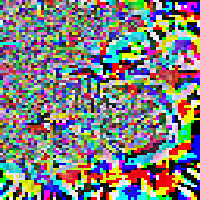

Dimensions : torch.Size([3, 80, 64]) 	Valeur min : 0.0 	Valeur max : 1.0


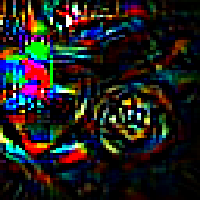

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.75769..8.787772].


Dimensions : torch.Size([3, 80, 64]) 	Valeur min : -9.7576904296875 	Valeur max : 8.787772178649902


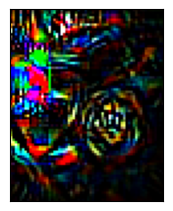

In [28]:
output_deconv_cropped = output_deconv[:, top:bottom, left:right]
display_image_tensor(output_deconv_cropped, resize=(200, 200))
display_image_tensor(output_deconv_cropped.clamp(0, 1), resize=(200, 200))
show_image_tensor(output_deconv_cropped, verbose=True)

Dimensions : torch.Size([3, 80, 64]) 	Valeur min : 0.0 	Valeur max : 8.787772178649902


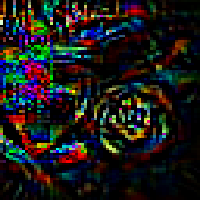

Dimensions : torch.Size([3, 80, 64]) 	Valeur min : 0.0 	Valeur max : 1.0


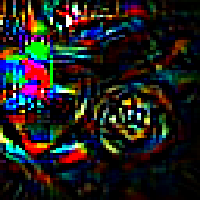

In [29]:
output_deconv_in_pixel_space = torch.nn.functional.relu(output_deconv_cropped)
display_image_tensor(output_deconv_in_pixel_space, resize=(200, 200))
display_image_tensor(output_deconv_in_pixel_space.clamp(0, 1), resize=(200, 200))

Dimensions : torch.Size([3, 80, 64]) 	Valeur min : 0.0 	Valeur max : 1.0


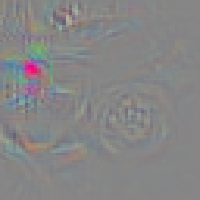

In [30]:
output_deconv_in_pixel_space = to_0_1(output_deconv_cropped)
display_image_tensor(output_deconv_in_pixel_space, resize=(200, 200))

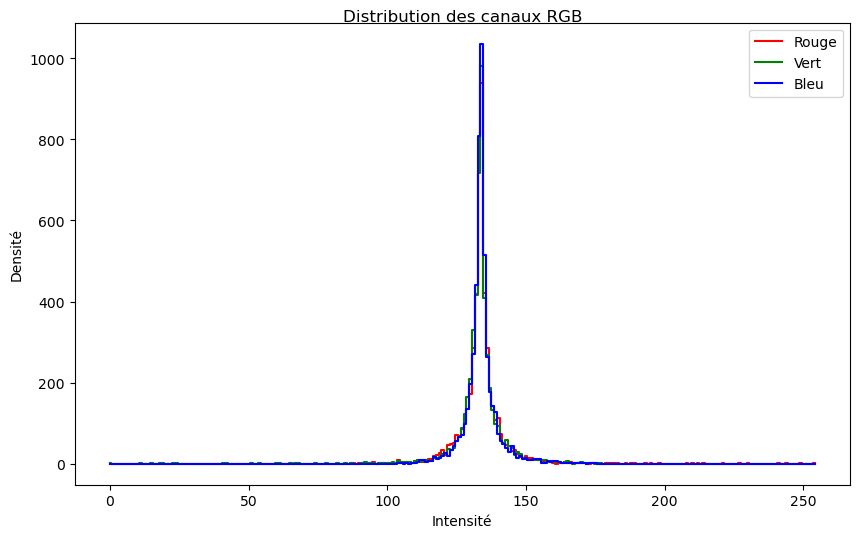

In [31]:
display_rgb_distributions(output_deconv_in_pixel_space.numpy().transpose(1, 2, 0)*255)

Dimensions : torch.Size([3, 80, 64]) 	Valeur min : -1.7297226190567017 	Valeur max : 2.4973998069763184


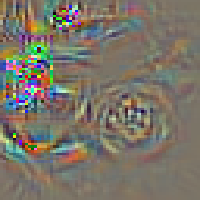

Dimensions : torch.Size([3, 80, 64]) 	Valeur min : 0.0 	Valeur max : 1.0


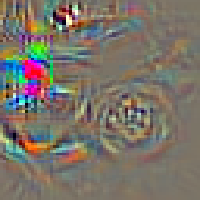

In [32]:
output_deconv_in_pixel_space = inv_normalize(output_deconv_cropped)
display_image_tensor(output_deconv_in_pixel_space, resize=(200, 200))
display_image_tensor(output_deconv_in_pixel_space.clamp(0, 1), resize=(200, 200))

Dimensions : torch.Size([3, 80, 64]) 	Valeur min : 0.0 	Valeur max : 1.0


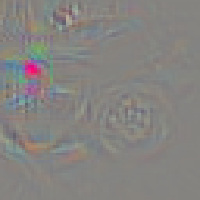

In [33]:
#display_image_tensor(to_0_255(unnormalize(output_deconv, mean=imagenet_mean, std=imagenet_std)), verbose=True)
output_deconv_in_pixel_space = to_0_1(inv_normalize(output_deconv_cropped))
display_image_tensor(output_deconv_in_pixel_space, resize=(200, 200))

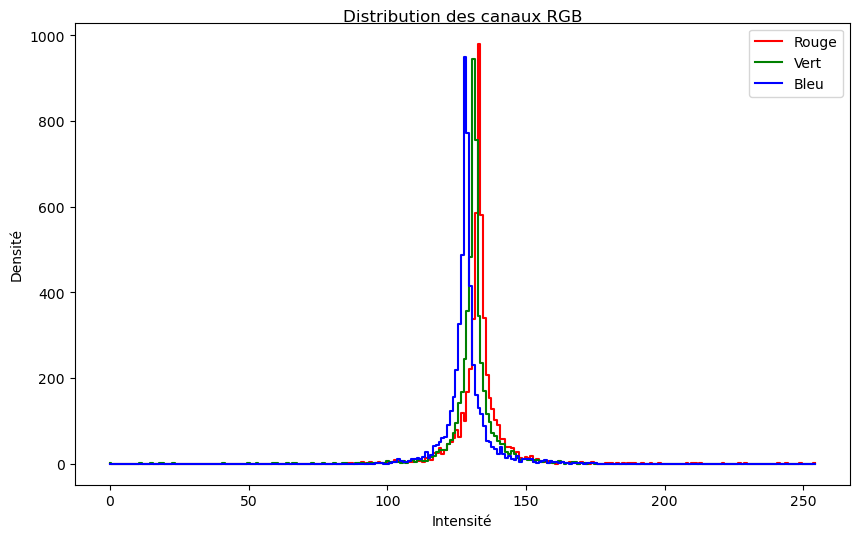

In [34]:
display_rgb_distributions(output_deconv_in_pixel_space.numpy().transpose(1, 2, 0)*255)

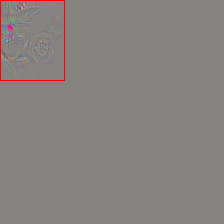

In [35]:
#output_deconv_in_pixel_space = unnormalize(output_deconv, mean=imagenet_mean, std=imagenet_std)
output_deconv_in_pixel_space = to_0_1(inv_normalize(output_deconv))

batch_input = batch_input.squeeze(dim=0)
output_deconv_receptive_field = T.functional.to_pil_image(output_deconv_in_pixel_space)
img_draw = ImageDraw.Draw(output_deconv_receptive_field)
img_draw.rectangle([(left, top), (right, bottom)], outline="red")
display(output_deconv_receptive_field)

Générer les instructions python utilisant les librairies `torch` et `torchvision` pour créer une image par superposition d'une image contenue dans le tenseur output, dont les coordonnées des coins supérieurs gauche et inférieur droit sont données par les coordonnées des coins supérieur gauche et inférieur droit du champ réceptif fournies par (left, top), (right, bottom), et d'une image de fond contenue dans le tenseur image.

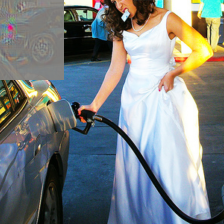

In [36]:
input_and_deconv = merge_input_and_deconv(image_resized, output_deconv_in_pixel_space, receptive_field, alpha=0.95)
display(input_and_deconv)

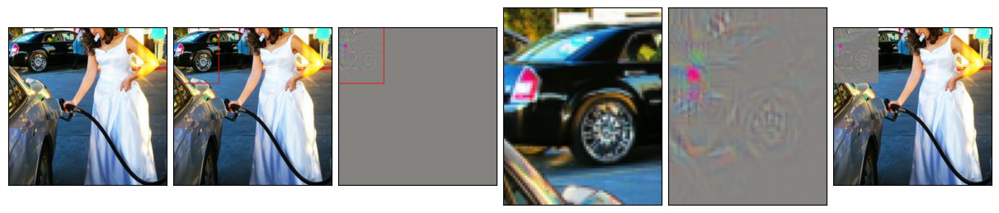

In [37]:
images = [
    image_resized,
    pil_to_tensor(image_resized_receptive_field),
    pil_to_tensor(output_deconv_receptive_field),
    #pil_to_tensor(T.functional.to_pil_image(image_resized).crop((left, top, right, bottom))),
    image_resized[:, top:bottom+1, left:right+1],
    #pil_to_tensor(T.functional.to_pil_image(output_deconv_in_pixel_space).crop((left, top, right, bottom))),
    output_deconv_in_pixel_space[:, top:bottom+1, left:right+1],
    pil_to_tensor(input_and_deconv)
    ]
display_images_list_grid(images, 6)

### Pour l'ensenble des neurones surveillés

Déconvolutions:   0%|          | 0/1 [00:00<?, ?couche/s]

=== Layer 7 neuron (327, 1, 0) ===
	Top value : 29.321617126464844, file_idx : 17349
	Champ réceptif : ((0, 0), (80, 64)) taille : 65 x 81


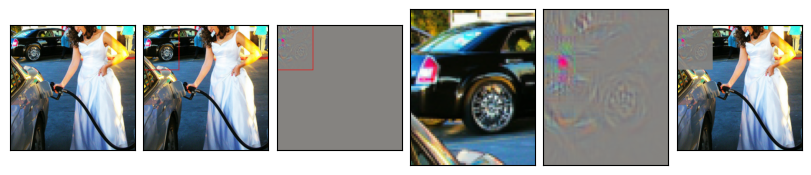

	Top value : 27.81341552734375, file_idx : 15944
	Champ réceptif : ((0, 0), (80, 64)) taille : 65 x 81


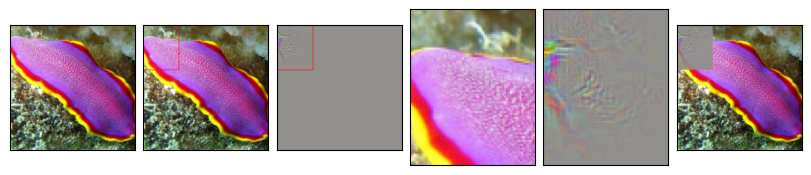

	Top value : 24.335033416748047, file_idx : 46705
	Champ réceptif : ((0, 0), (80, 64)) taille : 65 x 81


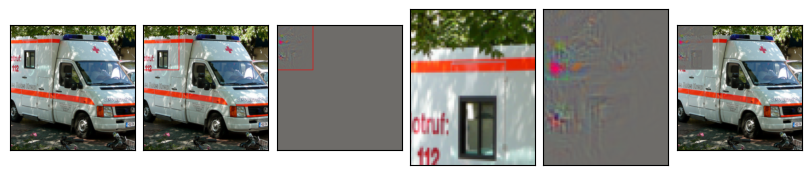

	Top value : 23.21392250061035, file_idx : 2381
	Champ réceptif : ((0, 0), (80, 64)) taille : 65 x 81


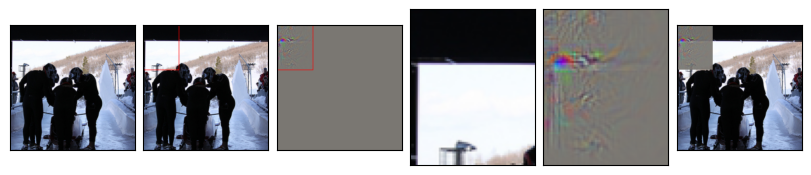

	Top value : 22.644380569458008, file_idx : 12908
	Champ réceptif : ((0, 0), (80, 64)) taille : 65 x 81


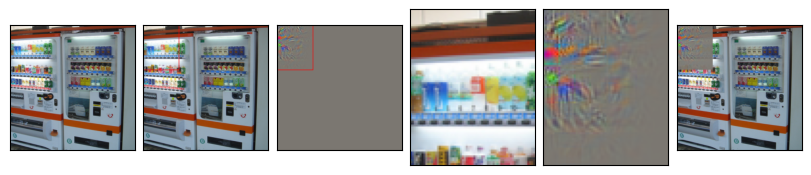

	Top value : 22.436588287353516, file_idx : 7698
	Champ réceptif : ((0, 0), (80, 64)) taille : 65 x 81


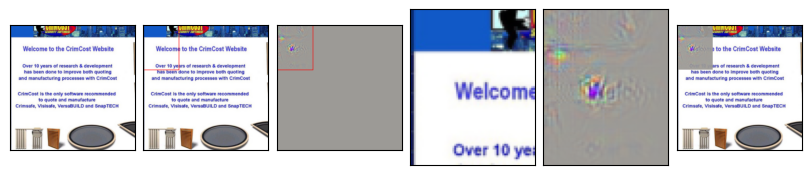

	Top value : 22.100126266479492, file_idx : 22143
	Champ réceptif : ((0, 0), (80, 64)) taille : 65 x 81


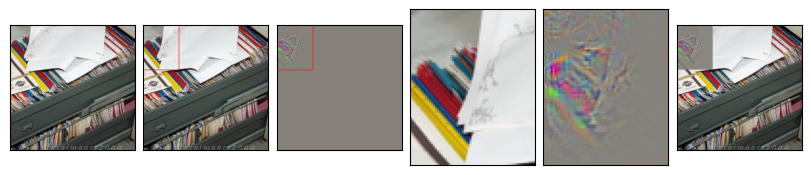

	Top value : 21.731922149658203, file_idx : 6356
	Champ réceptif : ((0, 0), (80, 64)) taille : 65 x 81


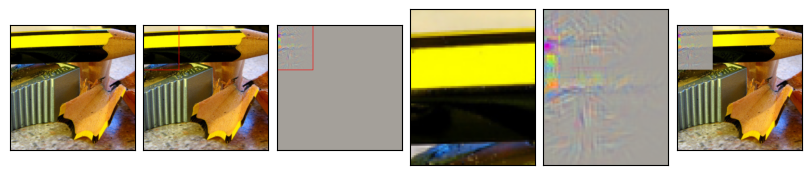

	Top value : 20.8695011138916, file_idx : 43570
	Champ réceptif : ((0, 0), (80, 64)) taille : 65 x 81


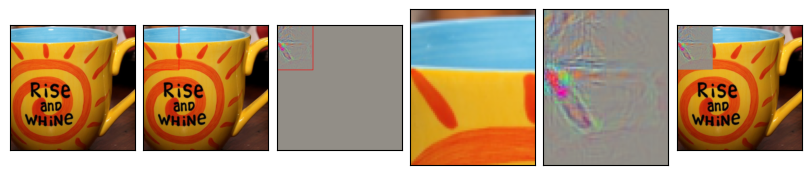

=== Layer 7 neuron (379, 4, 3) ===
	Top value : 51.76260757446289, file_idx : 11362
	Champ réceptif : ((30, 14), (128, 112)) taille : 99 x 99


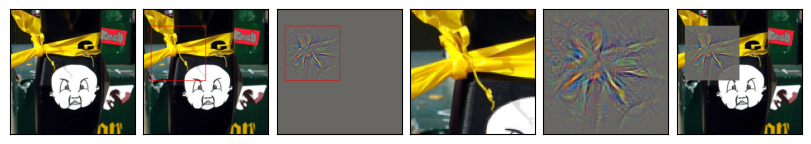

	Top value : 36.440425872802734, file_idx : 14139
	Champ réceptif : ((30, 14), (128, 112)) taille : 99 x 99


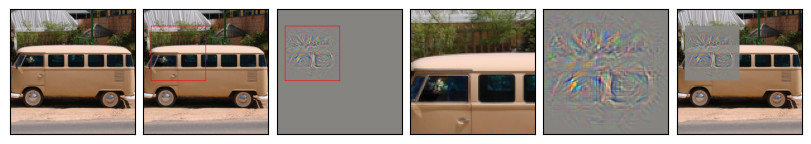

	Top value : 33.358638763427734, file_idx : 31869
	Champ réceptif : ((30, 14), (128, 112)) taille : 99 x 99


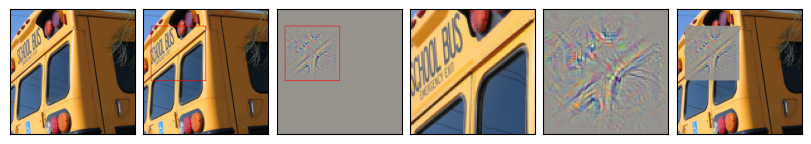

	Top value : 32.75972366333008, file_idx : 10265
	Champ réceptif : ((30, 14), (128, 112)) taille : 99 x 99


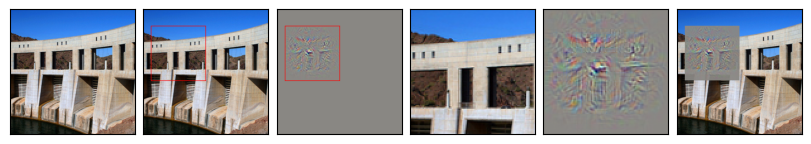

	Top value : 30.839014053344727, file_idx : 44960
	Champ réceptif : ((30, 14), (128, 112)) taille : 99 x 99


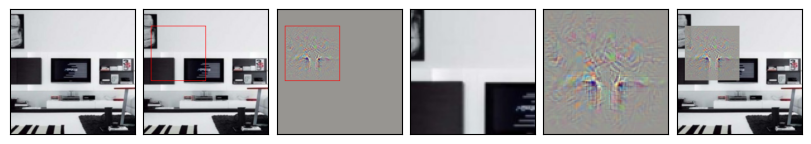

	Top value : 30.156614303588867, file_idx : 31570
	Champ réceptif : ((30, 14), (128, 112)) taille : 99 x 99


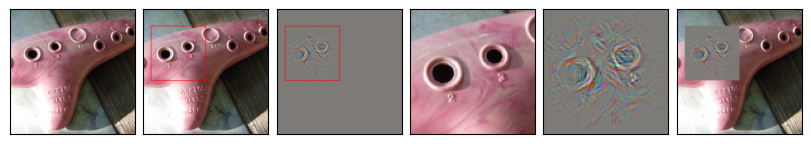

	Top value : 29.224018096923828, file_idx : 24283
	Champ réceptif : ((30, 14), (128, 112)) taille : 99 x 99


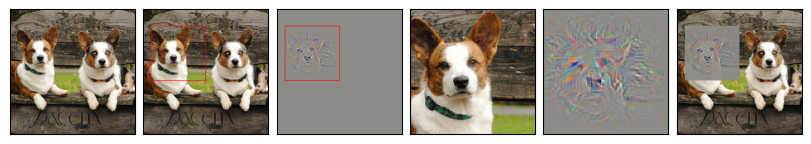

	Top value : 29.18781089782715, file_idx : 11570
	Champ réceptif : ((30, 14), (128, 112)) taille : 99 x 99


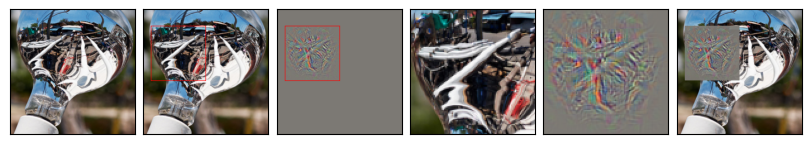

	Top value : 28.980710983276367, file_idx : 17504
	Champ réceptif : ((30, 14), (128, 112)) taille : 99 x 99


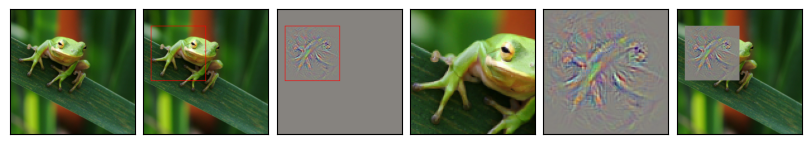

=== Layer 7 neuron (114, 2, 11) ===
	Top value : 42.70645523071289, file_idx : 13488
	Champ réceptif : ((0, 142), (96, 223)) taille : 82 x 97


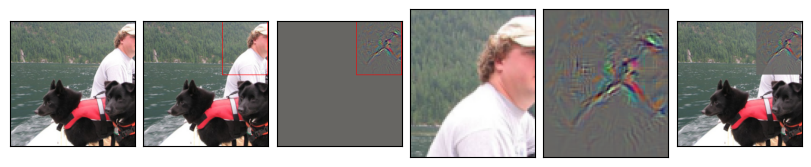

	Top value : 42.302146911621094, file_idx : 38798
	Champ réceptif : ((0, 142), (96, 223)) taille : 82 x 97


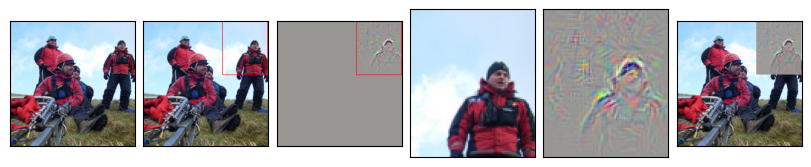

	Top value : 40.55919647216797, file_idx : 22138
	Champ réceptif : ((0, 142), (96, 223)) taille : 82 x 97


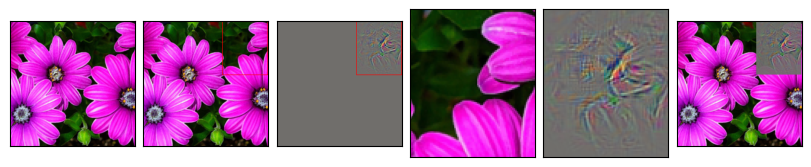

	Top value : 37.315120697021484, file_idx : 46385
	Champ réceptif : ((0, 142), (96, 223)) taille : 82 x 97


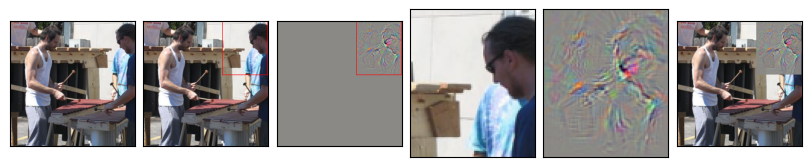

	Top value : 37.24177932739258, file_idx : 13037
	Champ réceptif : ((0, 142), (96, 223)) taille : 82 x 97


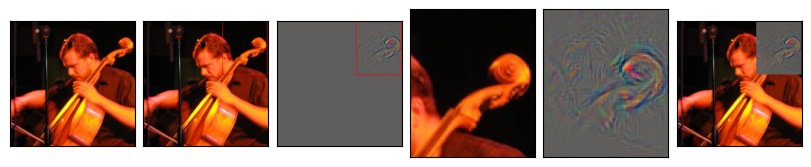

	Top value : 37.067962646484375, file_idx : 37604
	Champ réceptif : ((0, 142), (96, 223)) taille : 82 x 97


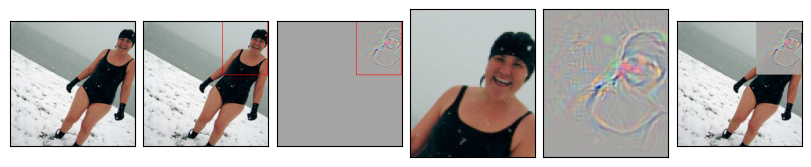

	Top value : 37.067962646484375, file_idx : 20056
	Champ réceptif : ((0, 142), (96, 223)) taille : 82 x 97


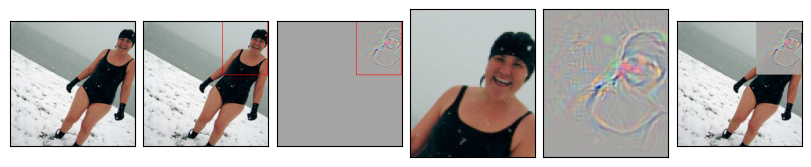

	Top value : 36.392303466796875, file_idx : 41246
	Champ réceptif : ((0, 142), (96, 223)) taille : 82 x 97


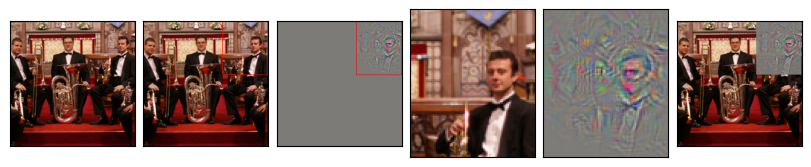

	Top value : 34.22685241699219, file_idx : 44133
	Champ réceptif : ((0, 142), (96, 223)) taille : 82 x 97


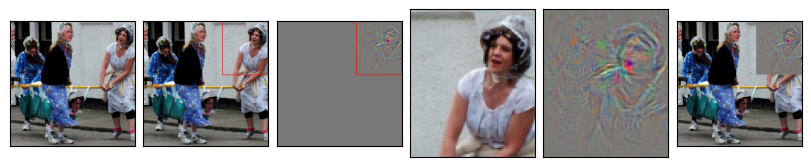

=== Layer 7 neuron (52, 10, 11) ===
	Top value : 62.939903259277344, file_idx : 36905
	Champ réceptif : ((126, 142), (223, 223)) taille : 82 x 98


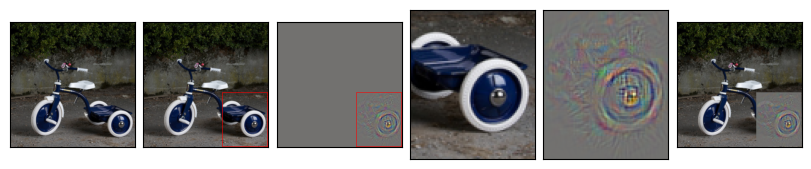

	Top value : 49.871768951416016, file_idx : 3015
	Champ réceptif : ((126, 142), (223, 223)) taille : 82 x 98


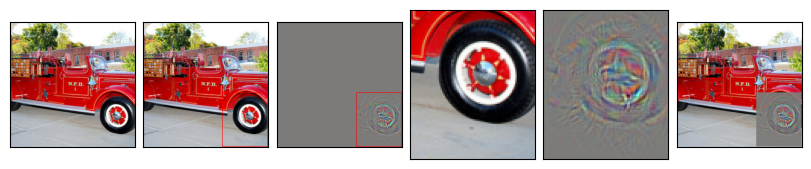

	Top value : 43.1909294128418, file_idx : 562
	Champ réceptif : ((126, 142), (223, 223)) taille : 82 x 98


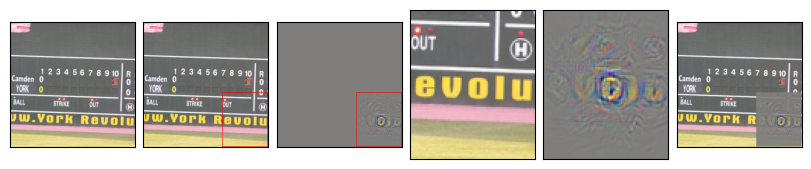

	Top value : 42.96964645385742, file_idx : 45491
	Champ réceptif : ((126, 142), (223, 223)) taille : 82 x 98


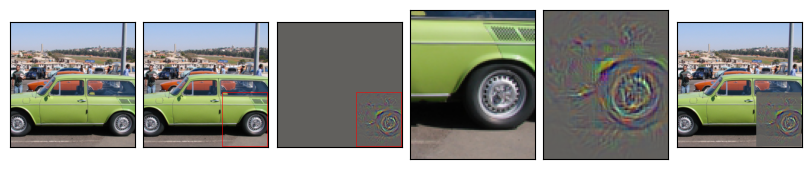

	Top value : 42.59708023071289, file_idx : 19162
	Champ réceptif : ((126, 142), (223, 223)) taille : 82 x 98


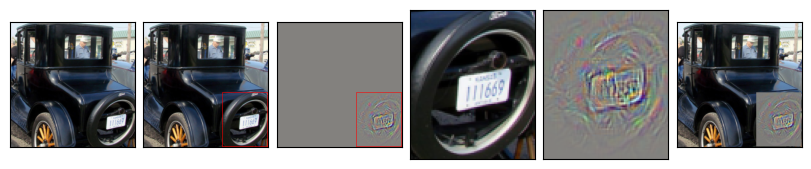

	Top value : 41.517601013183594, file_idx : 16793
	Champ réceptif : ((126, 142), (223, 223)) taille : 82 x 98


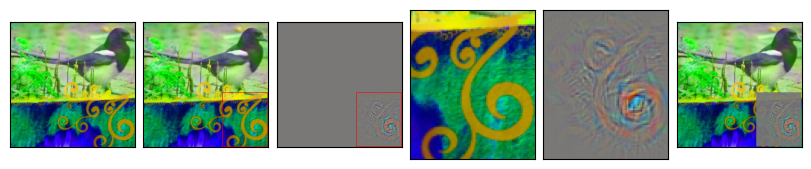

	Top value : 41.171390533447266, file_idx : 15288
	Champ réceptif : ((126, 142), (223, 223)) taille : 82 x 98


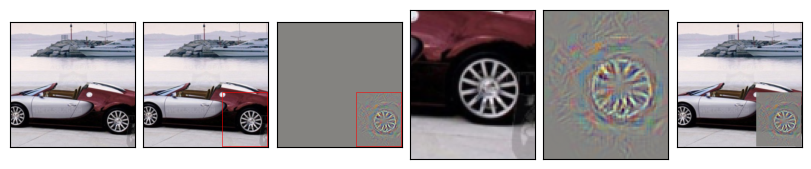

	Top value : 38.0623664855957, file_idx : 41823
	Champ réceptif : ((126, 142), (223, 223)) taille : 82 x 98


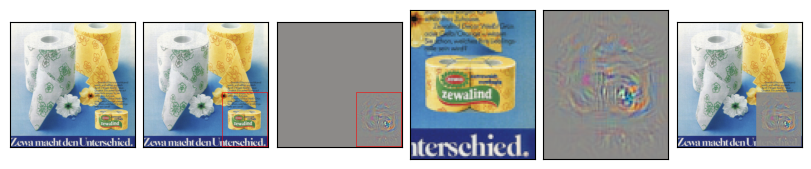

	Top value : 36.05889892578125, file_idx : 12211
	Champ réceptif : ((126, 142), (223, 223)) taille : 82 x 98


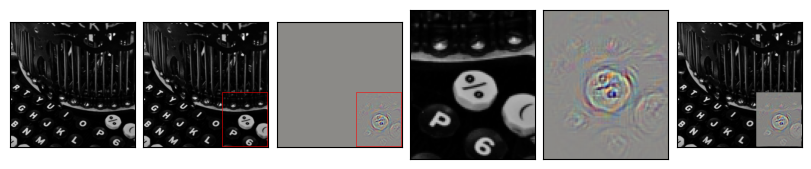

=== Layer 7 neuron (279, 1, 9) ===
	Top value : 38.06208419799805, file_idx : 46378
	Champ réceptif : ((0, 110), (80, 208)) taille : 99 x 81


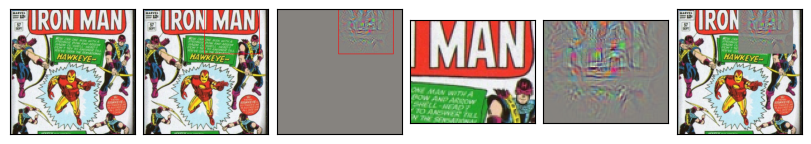

	Top value : 37.52967071533203, file_idx : 7867
	Champ réceptif : ((0, 110), (80, 208)) taille : 99 x 81


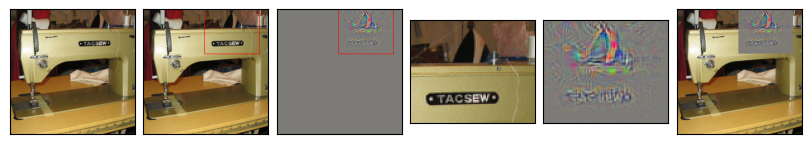

	Top value : 36.84196090698242, file_idx : 10329
	Champ réceptif : ((0, 110), (80, 208)) taille : 99 x 81


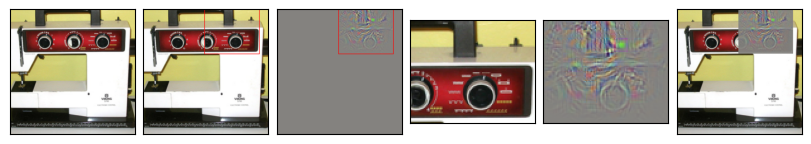

	Top value : 35.196651458740234, file_idx : 41627
	Champ réceptif : ((0, 110), (80, 208)) taille : 99 x 81


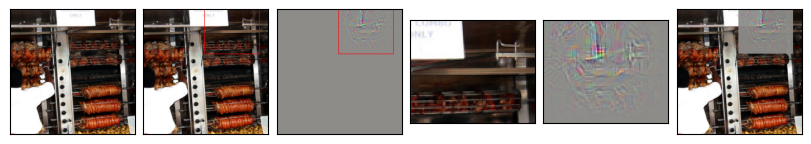

	Top value : 34.237815856933594, file_idx : 4231
	Champ réceptif : ((0, 110), (80, 208)) taille : 99 x 81


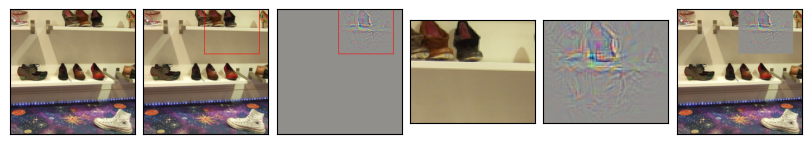

	Top value : 33.36157989501953, file_idx : 20869
	Champ réceptif : ((0, 110), (80, 208)) taille : 99 x 81


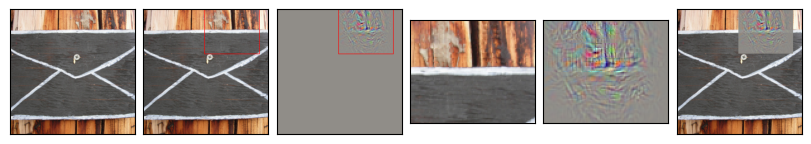

	Top value : 32.58019256591797, file_idx : 32508
	Champ réceptif : ((0, 110), (80, 208)) taille : 99 x 81


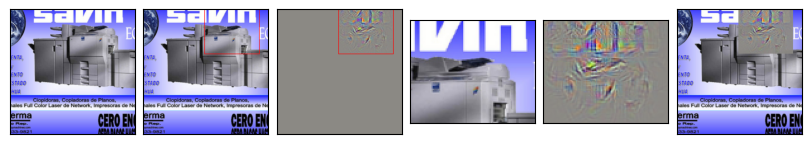

	Top value : 31.282594680786133, file_idx : 39171
	Champ réceptif : ((0, 110), (80, 208)) taille : 99 x 81


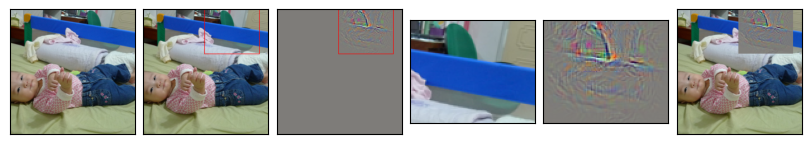

	Top value : 31.08607292175293, file_idx : 20753
	Champ réceptif : ((0, 110), (80, 208)) taille : 99 x 81


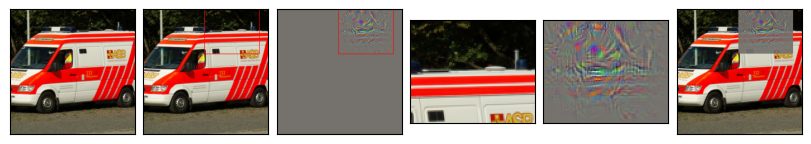

=== Layer 7 neuron (216, 0, 0) ===
	Top value : 19.521589279174805, file_idx : 33050
	Champ réceptif : ((0, 0), (64, 64)) taille : 65 x 65


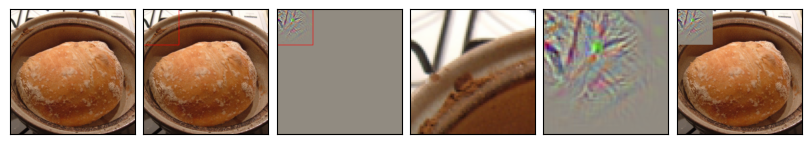

	Top value : 17.628032684326172, file_idx : 10244
	Champ réceptif : ((0, 0), (64, 64)) taille : 65 x 65


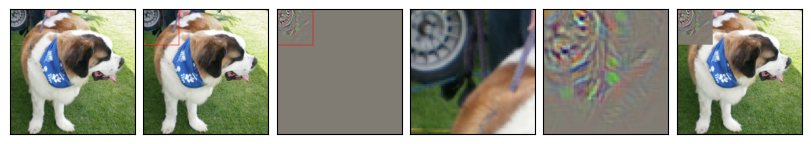

	Top value : 17.21758460998535, file_idx : 42348
	Champ réceptif : ((0, 0), (64, 64)) taille : 65 x 65


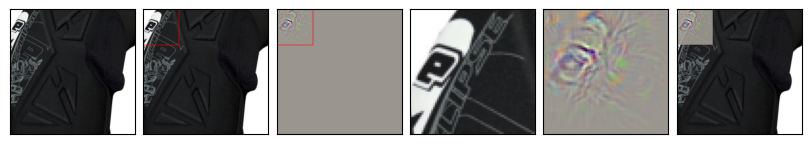

	Top value : 16.765722274780273, file_idx : 29960
	Champ réceptif : ((0, 0), (64, 64)) taille : 65 x 65


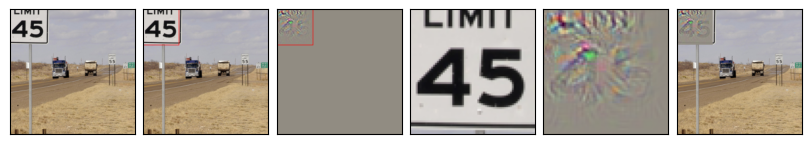

	Top value : 16.676651000976562, file_idx : 34261
	Champ réceptif : ((0, 0), (64, 64)) taille : 65 x 65


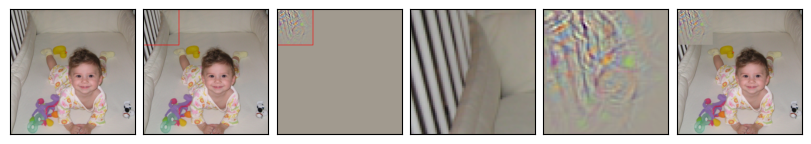

	Top value : 16.643009185791016, file_idx : 26300
	Champ réceptif : ((0, 0), (64, 64)) taille : 65 x 65


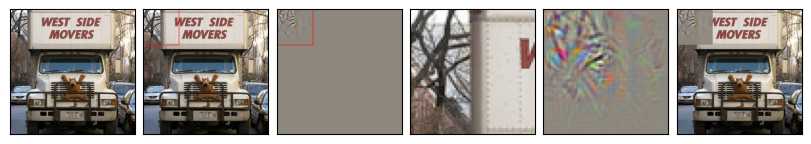

	Top value : 16.08229637145996, file_idx : 10318
	Champ réceptif : ((0, 0), (64, 64)) taille : 65 x 65


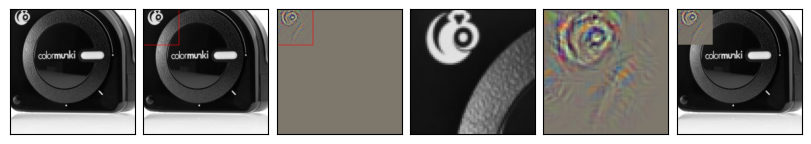

	Top value : 15.965278625488281, file_idx : 9938
	Champ réceptif : ((0, 0), (64, 64)) taille : 65 x 65


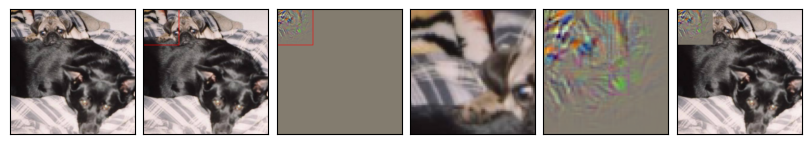

	Top value : 15.776928901672363, file_idx : 13159
	Champ réceptif : ((0, 0), (64, 64)) taille : 65 x 65


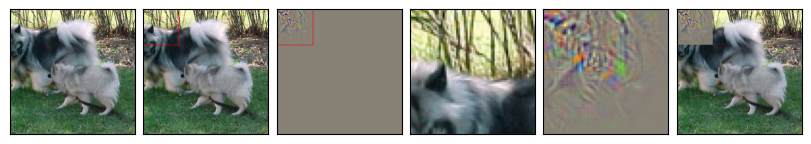

=== Layer 7 neuron (47, 3, 3) ===
	Top value : 23.860431671142578, file_idx : 38916
	Champ réceptif : ((14, 14), (112, 112)) taille : 99 x 99


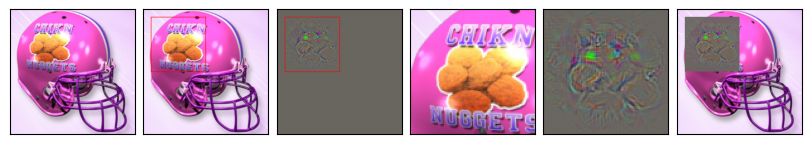

	Top value : 22.752466201782227, file_idx : 30413
	Champ réceptif : ((14, 14), (112, 112)) taille : 99 x 99


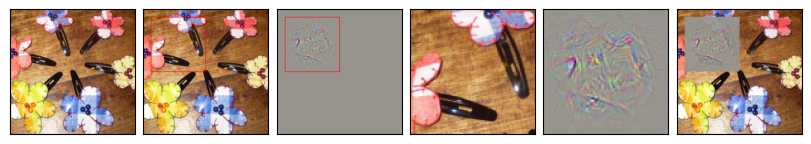

	Top value : 22.085771560668945, file_idx : 37432
	Champ réceptif : ((14, 14), (112, 112)) taille : 99 x 99


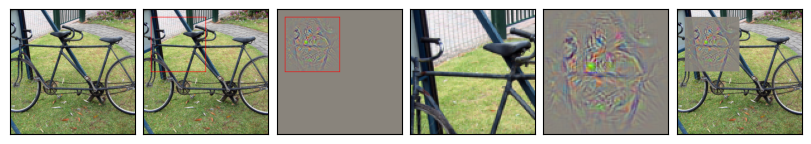

	Top value : 21.404542922973633, file_idx : 387
	Champ réceptif : ((14, 14), (112, 112)) taille : 99 x 99


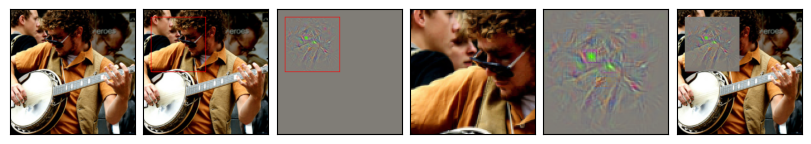

	Top value : 20.35040855407715, file_idx : 20718
	Champ réceptif : ((14, 14), (112, 112)) taille : 99 x 99


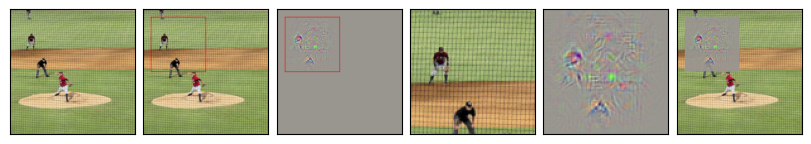

	Top value : 19.456445693969727, file_idx : 27547
	Champ réceptif : ((14, 14), (112, 112)) taille : 99 x 99


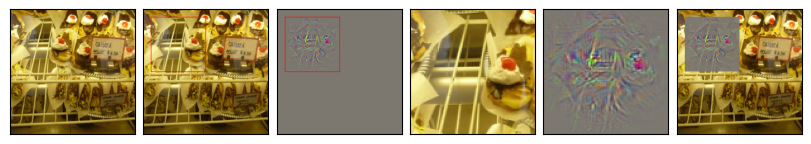

	Top value : 19.40592384338379, file_idx : 1511
	Champ réceptif : ((14, 14), (112, 112)) taille : 99 x 99


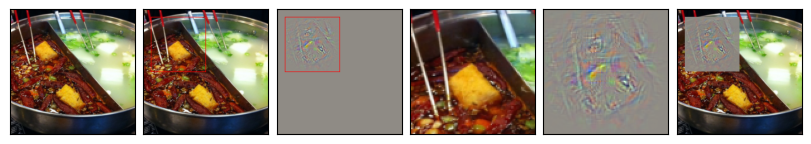

	Top value : 19.342037200927734, file_idx : 36176
	Champ réceptif : ((14, 14), (112, 112)) taille : 99 x 99


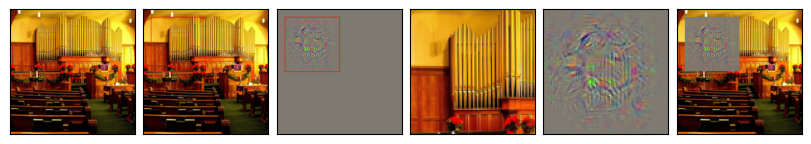

	Top value : 18.864599227905273, file_idx : 38677
	Champ réceptif : ((14, 14), (112, 112)) taille : 99 x 99


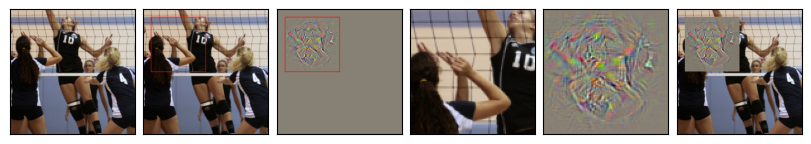

=== Layer 7 neuron (258, 9, 0) ===
	Top value : 40.76227951049805, file_idx : 14920
	Champ réceptif : ((110, 0), (208, 64)) taille : 65 x 99


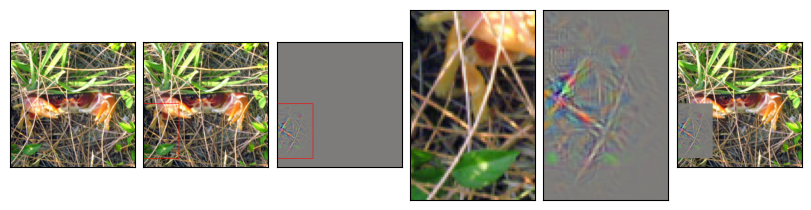

	Top value : 33.17182159423828, file_idx : 8536
	Champ réceptif : ((110, 0), (208, 64)) taille : 65 x 99


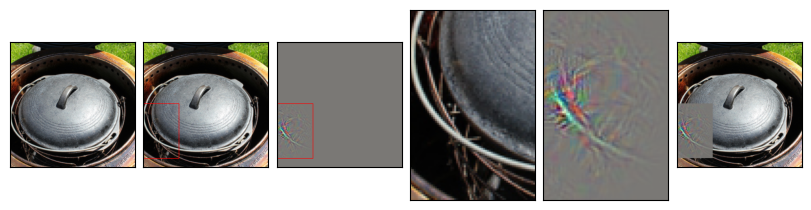

	Top value : 32.987098693847656, file_idx : 45677
	Champ réceptif : ((110, 0), (208, 64)) taille : 65 x 99


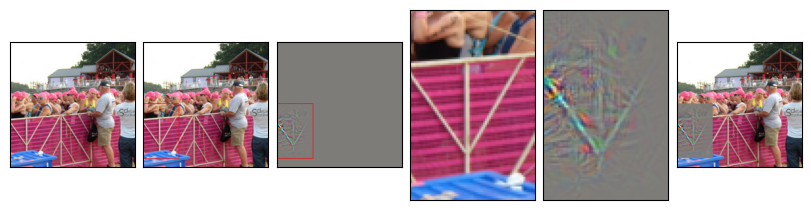

	Top value : 32.491355895996094, file_idx : 37482
	Champ réceptif : ((110, 0), (208, 64)) taille : 65 x 99


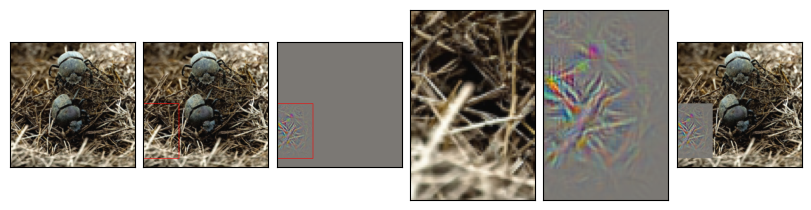

	Top value : 32.453346252441406, file_idx : 45443
	Champ réceptif : ((110, 0), (208, 64)) taille : 65 x 99


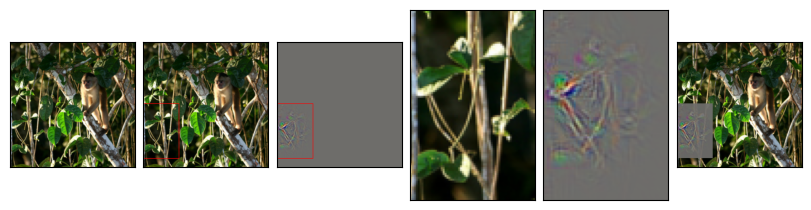

	Top value : 30.80171775817871, file_idx : 5829
	Champ réceptif : ((110, 0), (208, 64)) taille : 65 x 99


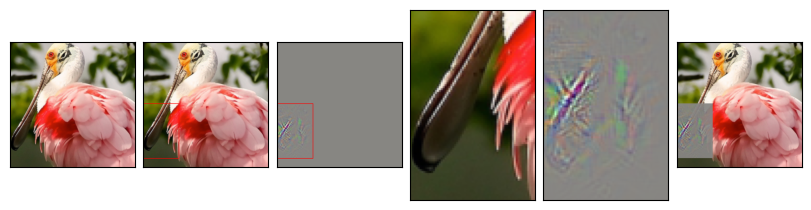

	Top value : 30.461238861083984, file_idx : 33030
	Champ réceptif : ((110, 0), (208, 64)) taille : 65 x 99


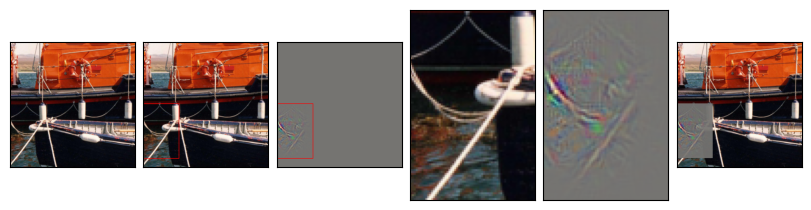

	Top value : 28.925636291503906, file_idx : 12312
	Champ réceptif : ((110, 0), (208, 64)) taille : 65 x 99


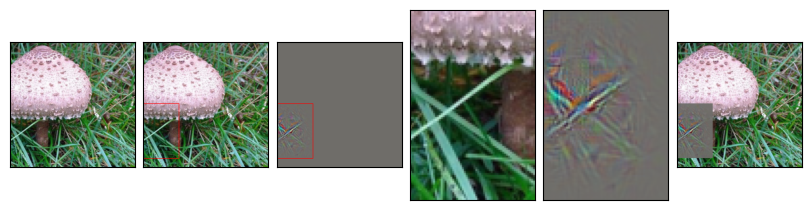

	Top value : 28.775630950927734, file_idx : 21035
	Champ réceptif : ((110, 0), (208, 64)) taille : 65 x 99


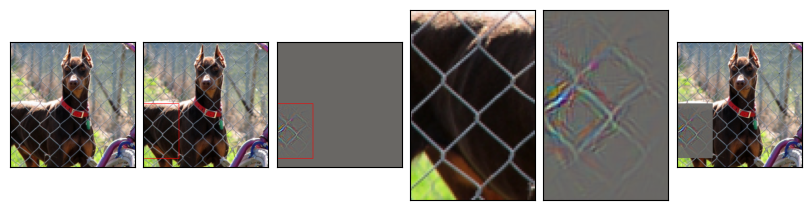

=== Layer 7 neuron (287, 3, 11) ===
	Top value : 27.89851188659668, file_idx : 5344
	Champ réceptif : ((14, 142), (112, 223)) taille : 82 x 99


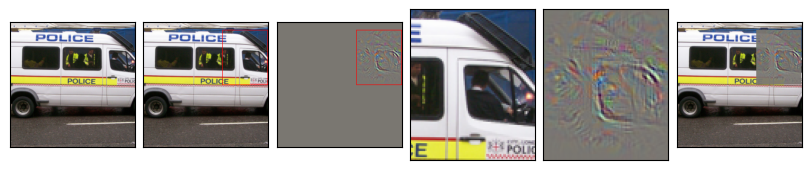

	Top value : 26.853328704833984, file_idx : 28890
	Champ réceptif : ((14, 142), (112, 223)) taille : 82 x 99


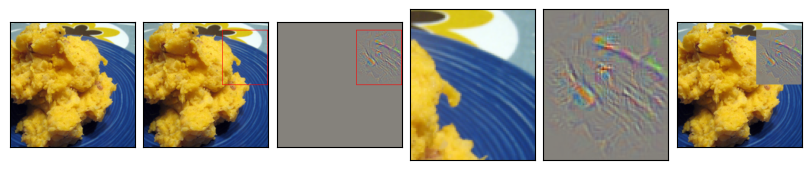

	Top value : 26.0743465423584, file_idx : 8536
	Champ réceptif : ((14, 142), (112, 223)) taille : 82 x 99


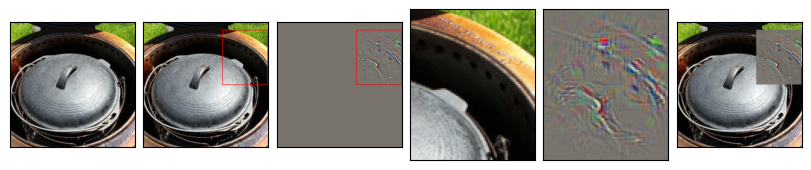

	Top value : 24.99341583251953, file_idx : 45749
	Champ réceptif : ((14, 142), (112, 223)) taille : 82 x 99


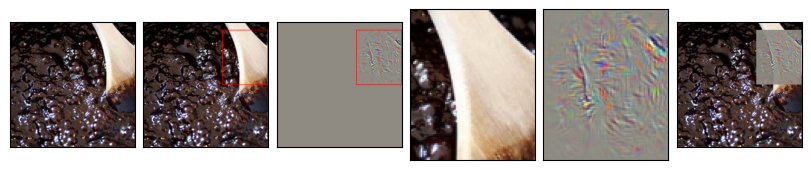

	Top value : 23.918264389038086, file_idx : 23783
	Champ réceptif : ((14, 142), (112, 223)) taille : 82 x 99


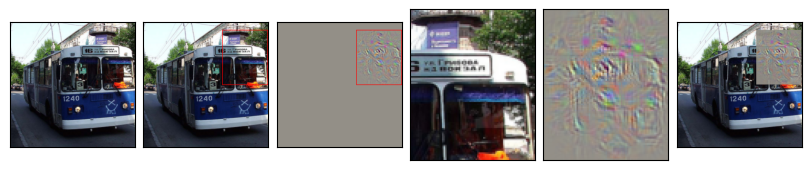

	Top value : 23.86861228942871, file_idx : 43180
	Champ réceptif : ((14, 142), (112, 223)) taille : 82 x 99


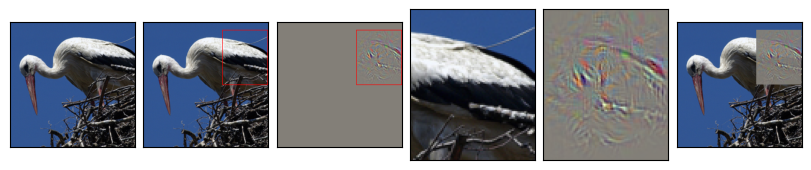

	Top value : 23.491413116455078, file_idx : 1578
	Champ réceptif : ((14, 142), (112, 223)) taille : 82 x 99


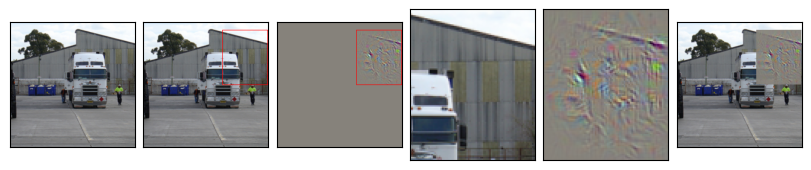

	Top value : 23.315414428710938, file_idx : 44909
	Champ réceptif : ((14, 142), (112, 223)) taille : 82 x 99


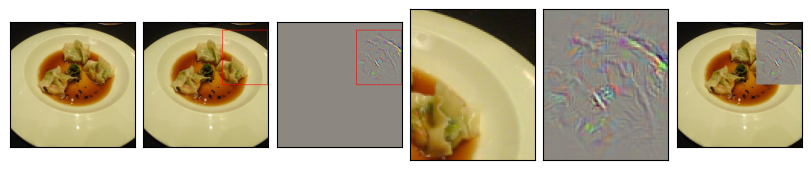

	Top value : 23.128459930419922, file_idx : 17495
	Champ réceptif : ((14, 142), (112, 223)) taille : 82 x 99


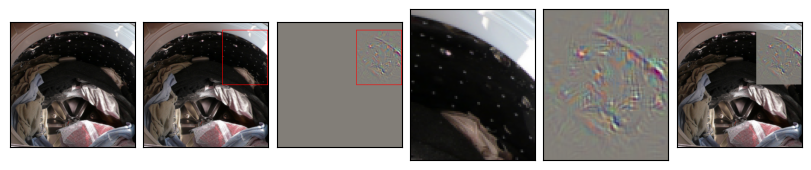

=== Layer 7 neuron (332, 11, 8) ===
	Top value : 28.50535774230957, file_idx : 16096
	Champ réceptif : ((142, 94), (223, 192)) taille : 99 x 82


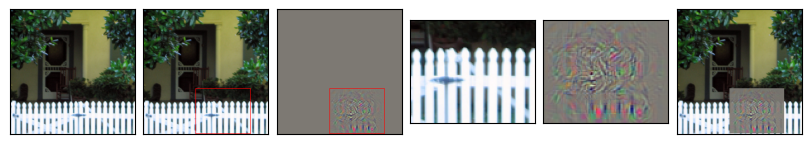

	Top value : 26.93300437927246, file_idx : 23588
	Champ réceptif : ((142, 94), (223, 192)) taille : 99 x 82


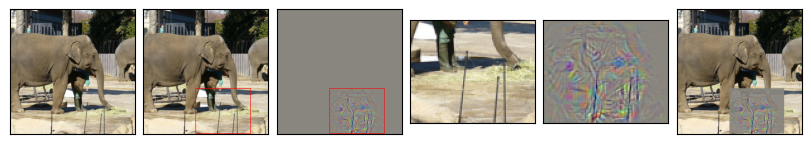

	Top value : 22.472414016723633, file_idx : 17256
	Champ réceptif : ((142, 94), (223, 192)) taille : 99 x 82


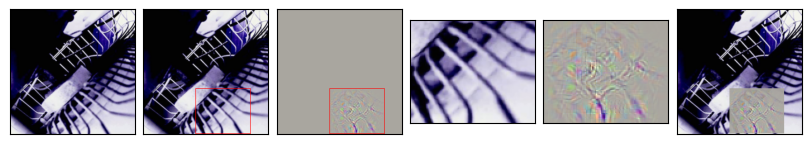

	Top value : 22.41157341003418, file_idx : 21848
	Champ réceptif : ((142, 94), (223, 192)) taille : 99 x 82


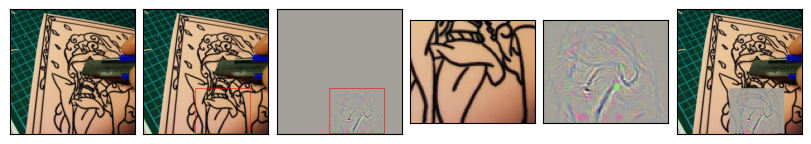

	Top value : 22.05162239074707, file_idx : 7822
	Champ réceptif : ((142, 94), (223, 192)) taille : 99 x 82


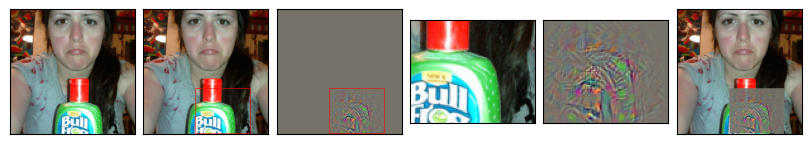

	Top value : 21.728219985961914, file_idx : 30063
	Champ réceptif : ((142, 94), (223, 192)) taille : 99 x 82


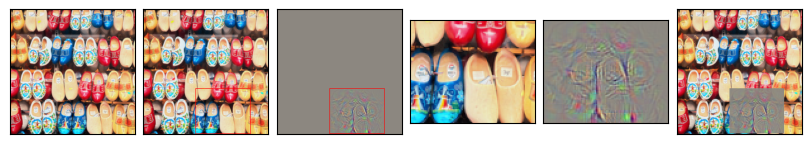

	Top value : 21.553653717041016, file_idx : 19290
	Champ réceptif : ((142, 94), (223, 192)) taille : 99 x 82


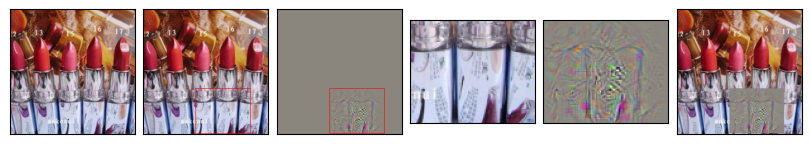

	Top value : 20.236331939697266, file_idx : 15491
	Champ réceptif : ((142, 94), (223, 192)) taille : 99 x 82


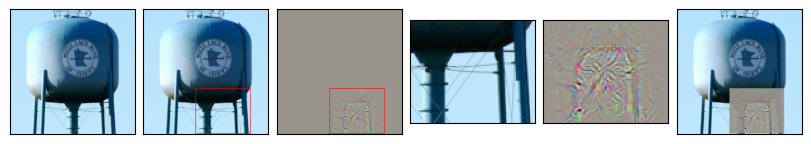

	Top value : 19.945627212524414, file_idx : 5708
	Champ réceptif : ((142, 94), (223, 192)) taille : 99 x 82


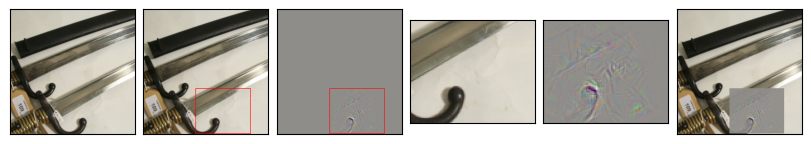

=== Layer 7 neuron (214, 3, 7) ===
	Top value : 32.95961380004883, file_idx : 37317
	Champ réceptif : ((14, 78), (112, 176)) taille : 99 x 99


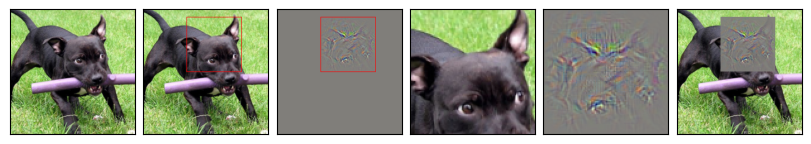

	Top value : 30.562192916870117, file_idx : 34781
	Champ réceptif : ((14, 78), (112, 176)) taille : 99 x 99


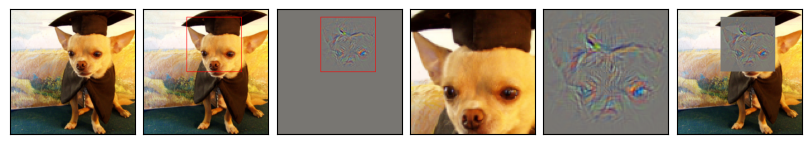

	Top value : 27.237348556518555, file_idx : 30473
	Champ réceptif : ((14, 78), (112, 176)) taille : 99 x 99


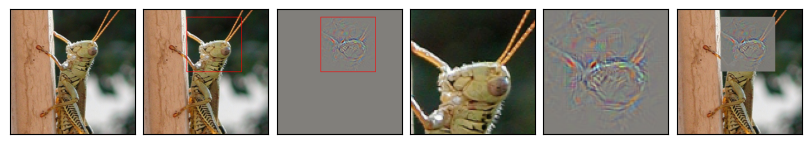

	Top value : 26.981779098510742, file_idx : 34154
	Champ réceptif : ((14, 78), (112, 176)) taille : 99 x 99


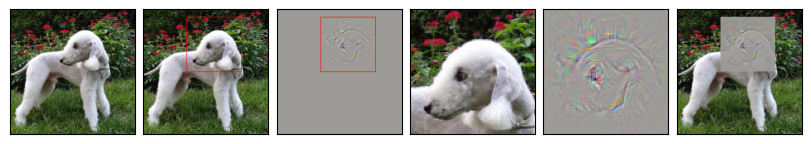

	Top value : 25.852083206176758, file_idx : 16657
	Champ réceptif : ((14, 78), (112, 176)) taille : 99 x 99


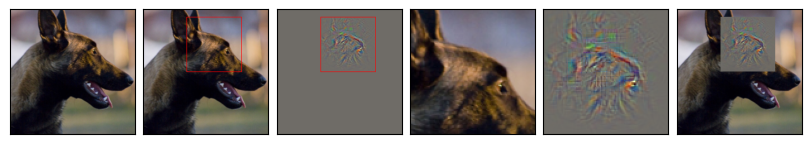

	Top value : 23.363008499145508, file_idx : 1316
	Champ réceptif : ((14, 78), (112, 176)) taille : 99 x 99


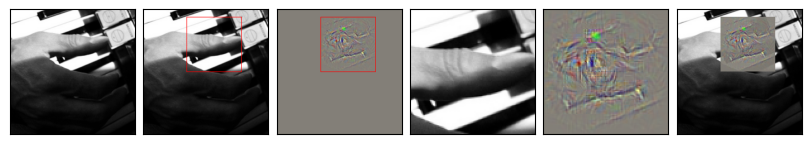

	Top value : 22.481657028198242, file_idx : 10244
	Champ réceptif : ((14, 78), (112, 176)) taille : 99 x 99


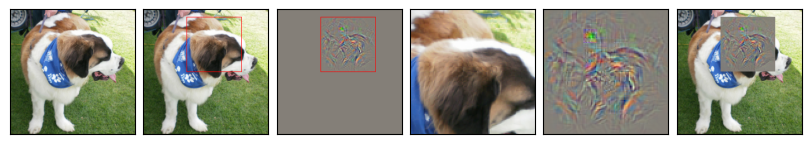

	Top value : 21.955358505249023, file_idx : 21376
	Champ réceptif : ((14, 78), (112, 176)) taille : 99 x 99


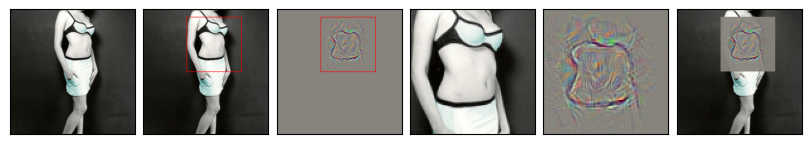

	Top value : 21.156417846679688, file_idx : 1928
	Champ réceptif : ((14, 78), (112, 176)) taille : 99 x 99


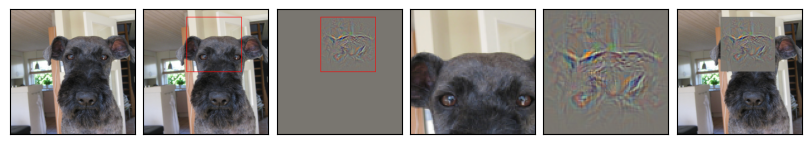

=== Layer 7 neuron (301, 4, 12) ===
	Top value : 29.586923599243164, file_idx : 6773
	Champ réceptif : ((30, 158), (128, 223)) taille : 66 x 99


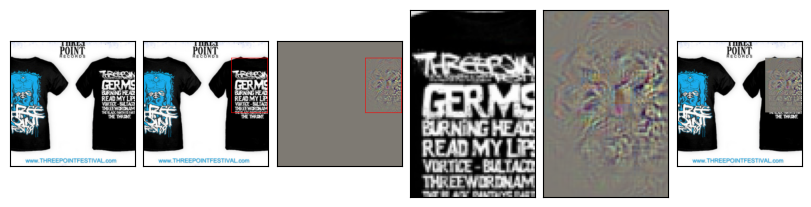

	Top value : 25.853635787963867, file_idx : 17641
	Champ réceptif : ((30, 158), (128, 223)) taille : 66 x 99


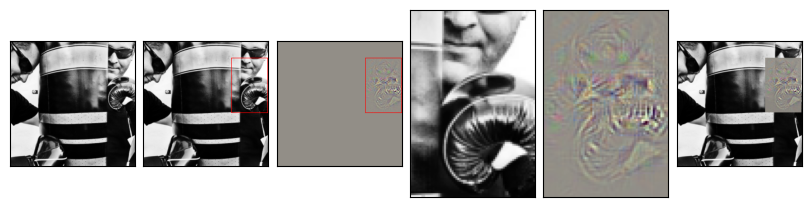

	Top value : 25.678972244262695, file_idx : 2450
	Champ réceptif : ((30, 158), (128, 223)) taille : 66 x 99


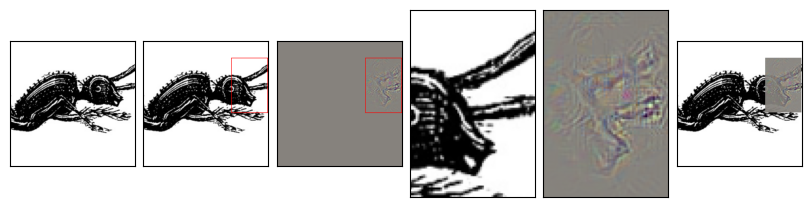

	Top value : 23.56814193725586, file_idx : 32478
	Champ réceptif : ((30, 158), (128, 223)) taille : 66 x 99


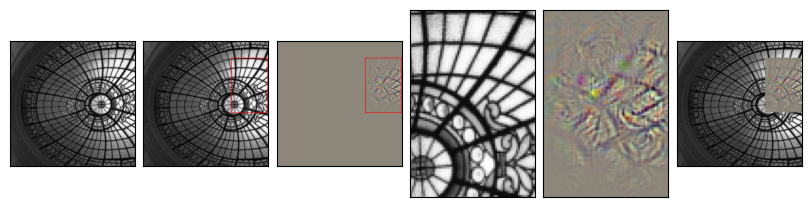

	Top value : 20.77254867553711, file_idx : 31151
	Champ réceptif : ((30, 158), (128, 223)) taille : 66 x 99


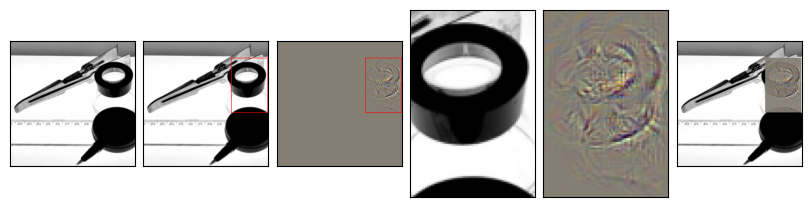

	Top value : 20.60457992553711, file_idx : 20050
	Champ réceptif : ((30, 158), (128, 223)) taille : 66 x 99


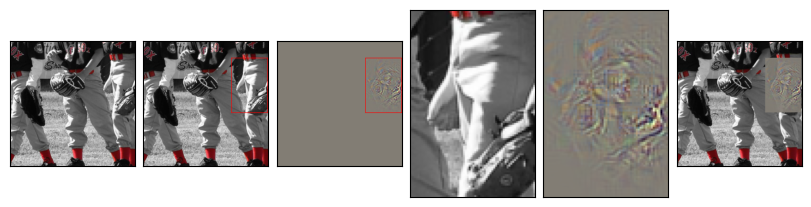

	Top value : 20.08290672302246, file_idx : 30348
	Champ réceptif : ((30, 158), (128, 223)) taille : 66 x 99


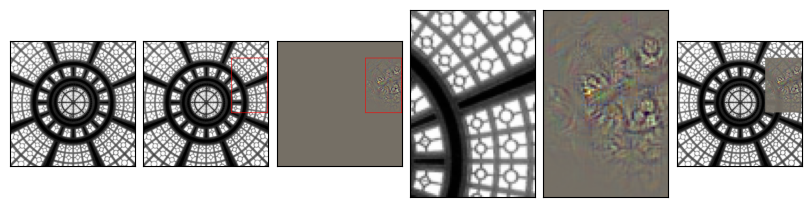

	Top value : 19.333524703979492, file_idx : 41814
	Champ réceptif : ((30, 158), (128, 223)) taille : 66 x 99


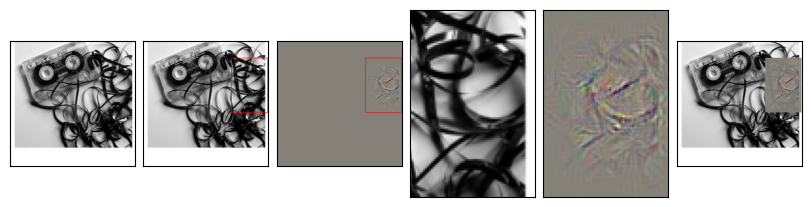

	Top value : 19.04755210876465, file_idx : 25656
	Champ réceptif : ((30, 158), (128, 223)) taille : 66 x 99


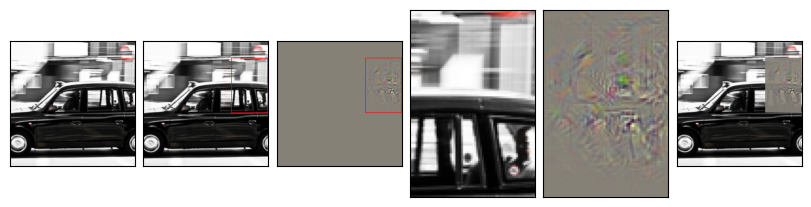

In [ ]:
for idx_layer, coords in tqdm(
    topk_activations_by_neuron.items(), total=len(topk_activations_by_neuron), desc="Déconvolutions", unit="couche"
    ):
    for coord, topk in coords.items():
        print(f"=== Layer {idx_layer} neuron {coord} ===")
        idx_map, row, col = coord
        
        for top_value, file_idx in topk:
            print(f"\tTop value : {top_value}, file_idx : {file_idx}")
            image, image_trfm = dataset.get_image(file_idx)
            #display_image_tensor(image, verbose=True)
            probed_neuron = (5, 82, 8, 9)

            # Champ réceptif       
            batch_input = image_trfm.unsqueeze(dim=0)
            output_sizes = get_output_sizes(model_for_deconv.convnet_features, input_size=batch_input.size())
            pixel_space_size = batch_input.size(-2), batch_input.size(-1)
            receptive_field = get_receptive_field_in_pixel_space(
                pos=(row, col),
                idx_layer=idx_layer,
                cnn_modules=model_for_deconv.convnet_features,
                output_sizes=output_sizes,
                pixel_space_size=pixel_space_size
            )

            # Drawing the receptive field
            ((top, left), (bottom, right)) = receptive_field
            print("\tChamp réceptif :", receptive_field, "taille :", right-left+1, "x", bottom-top+1)
            image_resized = geo_transforms(image)
            batch_input = batch_input.squeeze(dim=0)
            image_resized_receptive_field = T.functional.to_pil_image(image_resized)
            img_draw = ImageDraw.Draw(image_resized_receptive_field)
            img_draw.rectangle([(left, top), (right, bottom)], outline="red")


            # Déconvolution
            output_deconv = deconvolution(
                model_for_deconv,
                batch_input, # .to(device),
                idx_layer=idx_layer,
                idx_map=idx_map,
                pos=(row, col),
                flip_kernels=False,
                use_bias=False,
                clean_feature_map=True,
                return_pos=False,
                verbose=False
                ).detach().cpu()
            
            # Transformation to put deconv output in the pixel space
            #output_deconv_in_pixel_space = unnormalize(output_deconv, mean=imagenet_mean, std=imagenet_std)
            output_deconv_in_pixel_space = to_0_1(inv_normalize(output_deconv))
            

            # Drawing the receptive field in the deconv output
            output_deconv_receptive_field = T.functional.to_pil_image(output_deconv_in_pixel_space)
            img_draw = ImageDraw.Draw(output_deconv_receptive_field)
            img_draw.rectangle([(left, top), (right, bottom)], outline="red")

            # Merging
            input_and_deconv = merge_input_and_deconv(
                image_resized, output_deconv_in_pixel_space, receptive_field, alpha=0.95
                )

            # Displaying the images
            images = [
                image_resized,
                pil_to_tensor(image_resized_receptive_field),
                pil_to_tensor(output_deconv_receptive_field),
                #pil_to_tensor(T.functional.to_pil_image(image_resized).crop((left, top, right, bottom))),
                image_resized[:, top:bottom+1, left:right+1],
                #pil_to_tensor(T.functional.to_pil_image(output_deconv_in_pixel_space).crop((left, top, right, bottom))),
                output_deconv_in_pixel_space[:, top:bottom+1, left:right+1],
                pil_to_tensor(input_and_deconv)
                ]
            display_images_list_grid(images, per_rows=6, figsize=(8, 8))